# Case Study: Zeeguu/API
- Backend of a web application that supports [free reading in foreign languages](https://zeeguu.org)
- Open source [repository on GH](https://github.com/zeeguu/API/)

# Everything that we did in Data Gathering & Abstraction


In [108]:
# Installing Required Dependencies
import sys
sys.version
!{sys.executable} -m pip install gitpython
!{sys.executable} -m pip install pyvis

In [109]:
# In Collab our notebook runs in a temporary mounted file system
# Let's print the name of the folder where our script runs

import os
cwd = os.getcwd()
print(cwd)


c:\content\zeeguu-api


In [110]:
# Let's declare a var for the path where we're going to download a repository
# Warning: this must end in /
CODE_ROOT_FOLDER="/content/zeeguu-api/"


In [111]:
from git import Repo
# GitPython is a library that allows us to work easily with git from Python
# https://gitpython.readthedocs.io/en/stable/tutorial.html


# If the file exists, it means we've already downloaded
if not os.path.exists(CODE_ROOT_FOLDER):
  Repo.clone_from("https://github.com/zeeguu/api", CODE_ROOT_FOLDER)


In [112]:
# helper function to get a file path w/o having to always provide the /content/zeeguu-api/ prefix
def file_path(file_name):
    return CODE_ROOT_FOLDER+file_name

assert (file_path("zeeguu/core/model/user.py") == "/content/zeeguu-api/zeeguu/core/model/user.py")


In [113]:
# extracting a module name from a file name
def module_name_from_file_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name

assert 'zeeguu.core.model.user' == module_name_from_file_path(file_path('zeeguu/core/model/user.py'))

In [114]:
# naïve way of extracting imports using regular expressions
import re


# we assume that imports are always at the
# TODO for you: add full support for imports; this is not complete...
def import_from_line(line):

    # regex patterns used
    #   ^  - beginning of line
    #   \S - anything that is not space
    #   +  - at least one occurrence of previous
    #  ( ) - capture group (read more at: https://pynative.com/python-regex-capturing-groups/)
    try:
      y = re.search(r"^from (\S+)", line)
      if not y:
        y = re.search(r"^import (\S+)", line)
      return y.group(1)
    except:
      return None


# extracts all the imported modules from a file
# returns a module of the form zeeguu_core.model.bookmark, e.g.
def imports_from_file(file):

    all_imports = []

    lines = [line for line in open(file)]

    for line in lines:
        imp = import_from_line(line)

        if imp:
            all_imports.append(imp)

    return all_imports

imports_from_file(file_path('zeeguu/core/model/user.py'))

['datetime',
 'json',
 'random',
 're',
 'sqlalchemy.orm',
 'zeeguu.core',
 'sqlalchemy',
 'sqlalchemy.orm',
 'sqlalchemy.orm.exc',
 'zeeguu.core.language.difficulty_estimator_factory',
 'zeeguu.core.model.language',
 'zeeguu.core.model.learning_cycle',
 'zeeguu.logging',
 'zeeguu.core.util',
 'zeeguu.core.model',
 'zeeguu.logging']

In [115]:
# test
print(imports_from_file(file_path('zeeguu/core/model/bookmark.py')))
print(imports_from_file(file_path('zeeguu/core/model/unique_code.py')))

['datetime', 'sqlalchemy', 'sqlalchemy', 'sqlalchemy.orm', 'sqlalchemy.orm.exc', 'zeeguu.core.model.caption', 'zeeguu.core.model.video', 'zeeguu.logging', 'zeeguu.core.bookmark_quality.fit_for_study', 'zeeguu.core.model.article', 'zeeguu.core.model.exercise', 'zeeguu.core.model.exercise_outcome', 'zeeguu.core.model.exercise_source', 'zeeguu.core.model.language', 'zeeguu.core.model.source', 'zeeguu.core.model.text', 'zeeguu.core.model.user', 'zeeguu.core.model.user_word', 'zeeguu.core.model.learning_cycle', 'zeeguu.core.model.bookmark_user_preference', 'zeeguu.core.model.bookmark_context', 'zeeguu.core.model', 'zeeguu.core.util.encoding', 'wordstats']
['datetime', 'random', 'zeeguu.core', 'sqlalchemy', 'zeeguu.core.model']


## Now we extract the dependencies between all the files

To do that we iterate over all the python files with the hel pf the `Path.rglob` function from `pathlib`

And we create a network with the help of the `networkx` package.

In [116]:
import pathlib
from pathlib import Path
import networkx as nx

def dependencies_graph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.Graph()

    for file in files:
        file_path = str(file)

        module_name = module_name_from_file_path(file_path)

        if module_name not in G.nodes:
            G.add_node(module_name)

        for each in imports_from_file(file_path):

            # i want the edge weight to correspond to the number of times a module is imported
            # if the module is already in the graph, we increase the weight of the edge
            if G.has_edge(module_name, each):
                G[module_name][each]['weight'] += 1
            else:
                G.add_edge(module_name, each, weight=1)

            # G.add_edge(module_name, each)

    return G

## Mathplotlib also has support for drawing networks

We do a simple drawing of all the files and their dependencies in our system

In [117]:
import matplotlib.pyplot as plt

# a function to draw a graph
def draw_graph(G, size, **args):
    plt.figure(figsize=size)
    nx.draw(G, **args)
    plt.show()

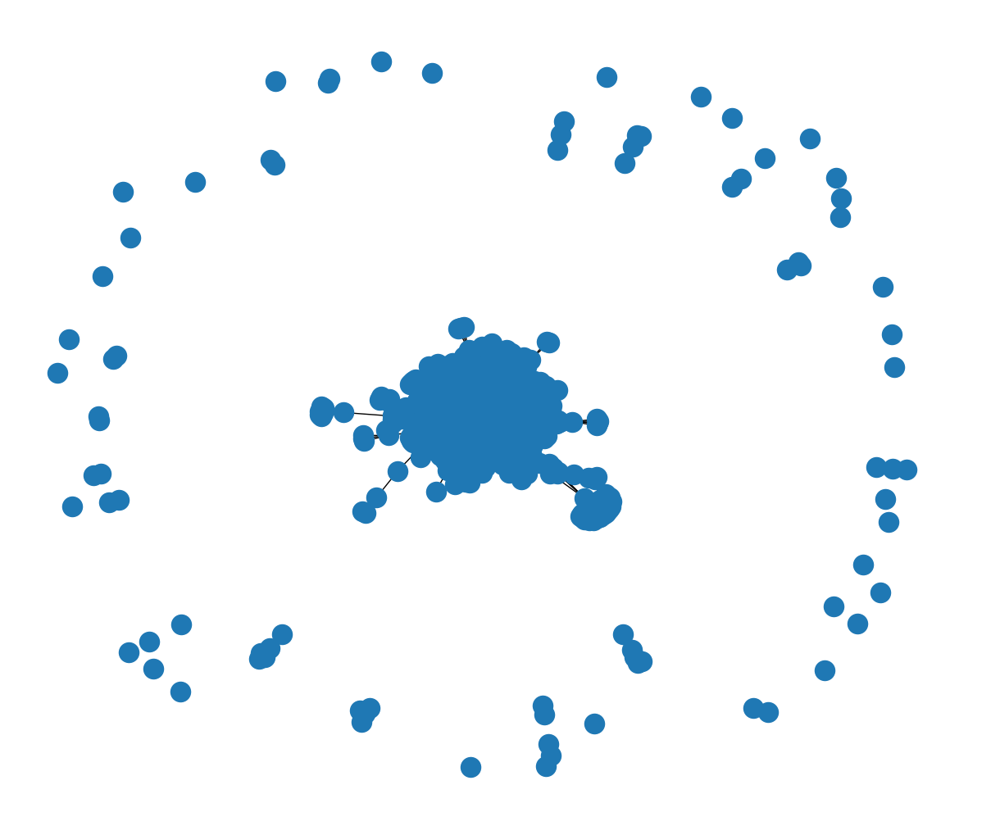

In [118]:
G = dependencies_graph(CODE_ROOT_FOLDER)
draw_graph(G, (12,10), with_labels=False)

## Abstraction

In [119]:
# Let's define some relevant modules
def relevant_module(module_name):

  if "test" in module_name:
    return False


  if module_name.startswith("zeeguu"):
    return True


  return False

In [120]:
# However, if we think a bit more about it, we realize that a dependency graph
# is a directed graph (e.g. module A depends on m)
# with any kinds of graph either directed (nx.DiGraph) or
# non-directed (nx.Graph)

def dependencies_digraph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):

              if G.has_edge(source_module, target_module):
                G[source_module][target_module]['weight'] += 1
              else:
                  G.add_edge(source_module, target_module, weight=1)

              # G.add_edge(source_module, target_module)


    return G


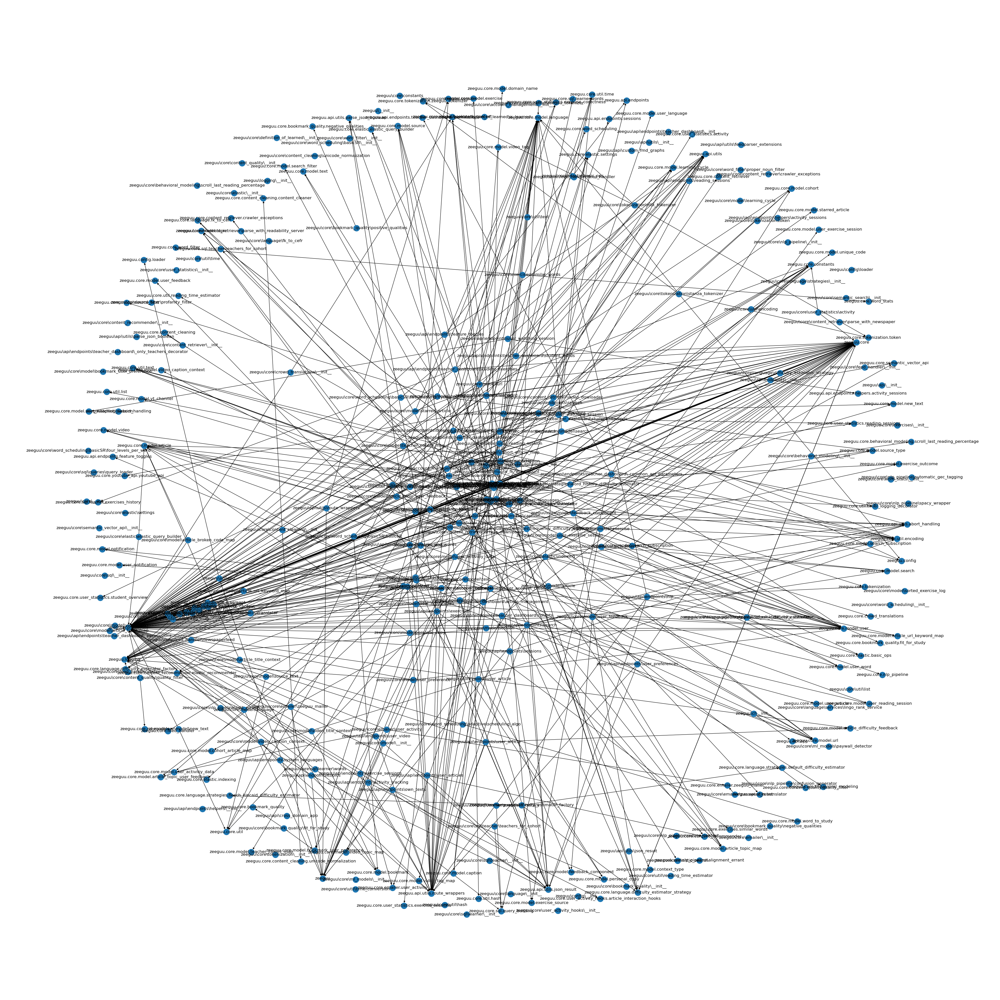

In [121]:
# Looking at the directed graph
DG = dependencies_digraph(CODE_ROOT_FOLDER)
draw_graph(DG, (40,40), with_labels=True)

## Basic Abstraction Using Hierarchical Module Structure & Naming Conventions

- abstracting the imports between the modules along the module hierarchy
- also taking into account naming conventions to filter out external modules

In [122]:
# extracts the parent of depth X
def top_level_package(module_name, depth=1):
    module_name = module_name.replace("/", ".").replace("\\", ".")
    components = module_name.split(".")
    return ".".join(components[:depth])

assert (top_level_package("zeeguu.core.model.util") == "zeeguu")
assert (top_level_package("zeeguu.core.model.util", 2) == "zeeguu.core")

In [123]:
def abstracted_to_top_level(G, depth=1):
    aG = nx.DiGraph()
    for each in G.edges():
        src = top_level_package(each[0], depth)
        dst = top_level_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

In [124]:
ADG = abstracted_to_top_level(DG, 2)  

In [125]:
plt.figure(figsize=(10,10))

# draw the graph with edge weights
edge_labels = nx.get_edge_attributes(ADG, 'weight')

# draw with edge labels
pos = nx.spring_layout(ADG, k=0.5, iterations=20)
plt.show()

<Figure size 1000x1000 with 0 Axes>

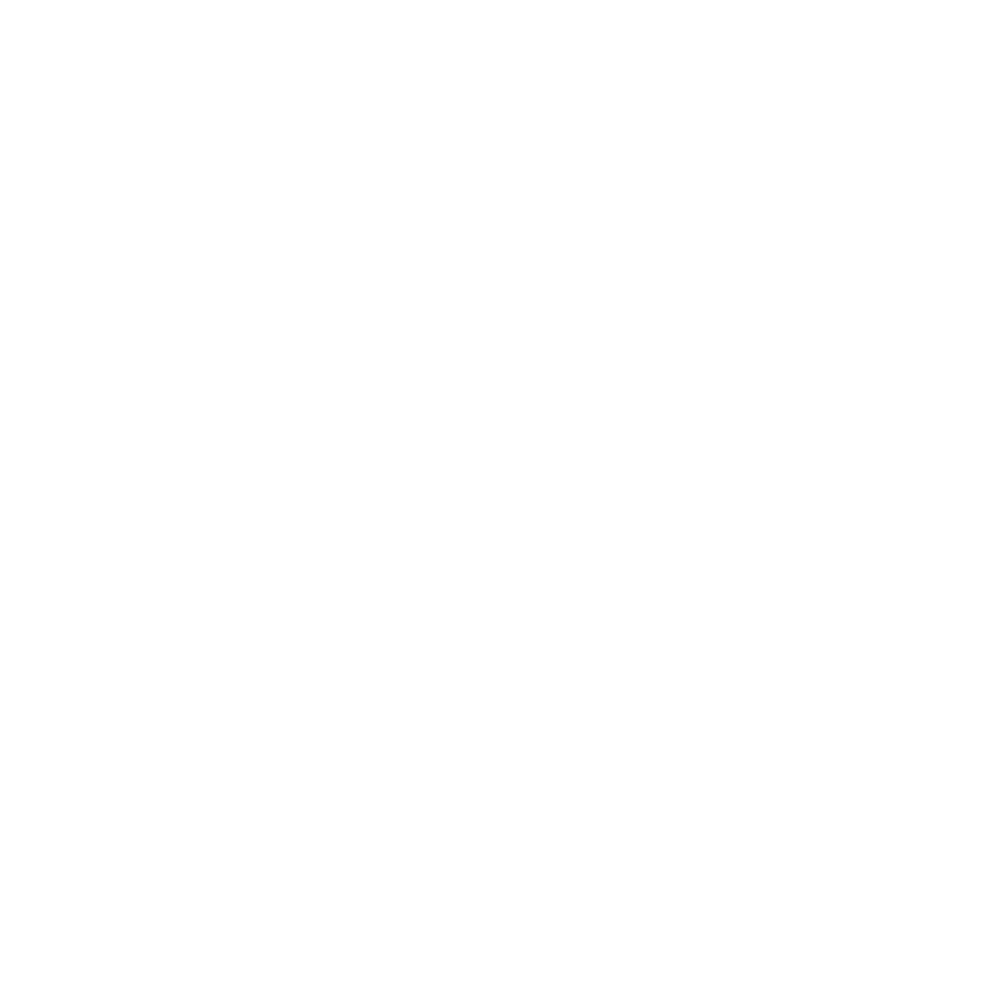

In [126]:
# NIKO tries
DG_zeeguu = dependencies_digraph(CODE_ROOT_FOLDER + '/zeeguu')
ADG_zeeguu = abstracted_to_top_level(DG_zeeguu, 1)

plt.figure(figsize=(10,10))
nx.draw(ADG_zeeguu, with_labels=True)
plt.show()


# Evolution Analysis

In [127]:
!{sys.executable} -m pip install pydriller==2.6


In [128]:
from pydriller import Repository
REPO_DIR = 'https://github.com/zeeguu/api'


In [129]:
# for PyDriller to work we need to change directory to our local clone of the repo
%cd /content/zeeguu-api

c:\content\zeeguu-api


In [130]:
all_commits = list(Repository(REPO_DIR).traverse_commits())

def print_out_commit_details(commits):
  for commit in commits:
      print(commit)
      for each in commit.modified_files:
          print(f"{commit.author.name} {each.change_type} {each.filename}\n -{each.old_path}\n -{each.new_path}")

print_out_commit_details(all_commits[0:1])

Mircea Lungu ModificationType.ADD LICENSE
 -None
 -LICENSE
Mircea Lungu ModificationType.ADD README.md
 -None
 -README.md
Mircea Lungu ModificationType.ADD s
 -None
 -s
Mircea Lungu ModificationType.ADD setup.py
 -None
 -setup.py
Mircea Lungu ModificationType.ADD zeeguu_api.wsgi
 -None
 -zeeguu_api.wsgi
Mircea Lungu ModificationType.ADD __init__.py
 -None
 -zeeguu_api\__init__.py
Mircea Lungu ModificationType.ADD __main__.py
 -None
 -zeeguu_api\__main__.py
Mircea Lungu ModificationType.ADD __init__.py
 -None
 -zeeguu_api\api\__init__.py
Mircea Lungu ModificationType.ADD download_content_from_url.py
 -None
 -zeeguu_api\api\download_content_from_url.py
Mircea Lungu ModificationType.ADD exercises.py
 -None
 -zeeguu_api\api\exercises.py
Mircea Lungu ModificationType.ADD feeds.py
 -None
 -zeeguu_api\api\feeds.py
Mircea Lungu ModificationType.ADD sessions.py
 -None
 -zeeguu_api\api\sessions.py
Mircea Lungu ModificationType.ADD smartwatch.py
 -None
 -zeeguu_api\api\smartwatch.py
Mircea Lungu 

In [ ]:
from collections import defaultdict

commit_counts = defaultdict(int)

for commit in all_commits:
    for each in commit.modified_files:
        try:
            commit_counts [each.new_path] += 1
        except:
            pass

# sort by number of commits in decreasing order
sorted(commit_counts.items(), key=lambda x: x[1], reverse=True)[:42]

# discussion: What is ("None", 103) ?

In [ ]:
from pydriller import ModificationType

commit_counts = {}

for commit in all_commits:
    for modification in commit.modified_files:

        new_path = modification.new_path
        old_path = modification.old_path

        try:

            if modification.change_type == ModificationType.RENAME:
                commit_counts[new_path]=commit_counts.get(old_path,0)+1
                commit_counts.pop(old_path)

            elif modification.change_type == ModificationType.DELETE:
                commit_counts.pop(old_path, '')

            elif modification.change_type == ModificationType.ADD:
                commit_counts[new_path] = 1

            else: # modification to existing file
                    commit_counts [old_path] += 1
        except Exception as e:
            print(str(e) + "something went wrong with: " + str(modification))
            pass

sorted(commit_counts.items(), key=lambda x:x[1], reverse=True)

In [134]:


def module_name_from_rel_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name


assert ("tools.migrations.teacher_dashboard_migration_1.upgrade" == module_name_from_rel_path("tools/migrations/teacher_dashboard_migration_1/upgrade.py"))

assert ("zeeguu.api") == module_name_from_rel_path("zeeguu/api/__init__.py")

In [135]:
package_activity = defaultdict(int)

for path, count in commit_counts.items():
    if ".py" in str(path):
        l2_module = top_level_package(module_name_from_rel_path(path), 2)
        package_activity[l2_module] += count

sorted_sizes = sorted(package_activity.items(), key=lambda x: x[1], reverse=True)

print(sorted_sizes)



[('zeeguu_api.api', 100), ('zeeguu_api.tests', 60), ('zeeguu_api.app', 17), ('setup', 15), ('tools.add_rssfeed', 3), ('zeeguu_api.__main__', 2), ('collect_performance', 2), ('zeeguu_api.__init__', 1), ('zeeguu_api.cross_domain_app', 1), ('tools.delete_feed', 1), ('tools.feed_info', 1), ('tools.update_feed', 1), ('tools.bookmark_info', 1)]


In [136]:

sizes = []

for n in ADG.nodes():
  sizes.append(package_activity[n])

print(sizes)




[0, 0, 0, 0, 0, 0]


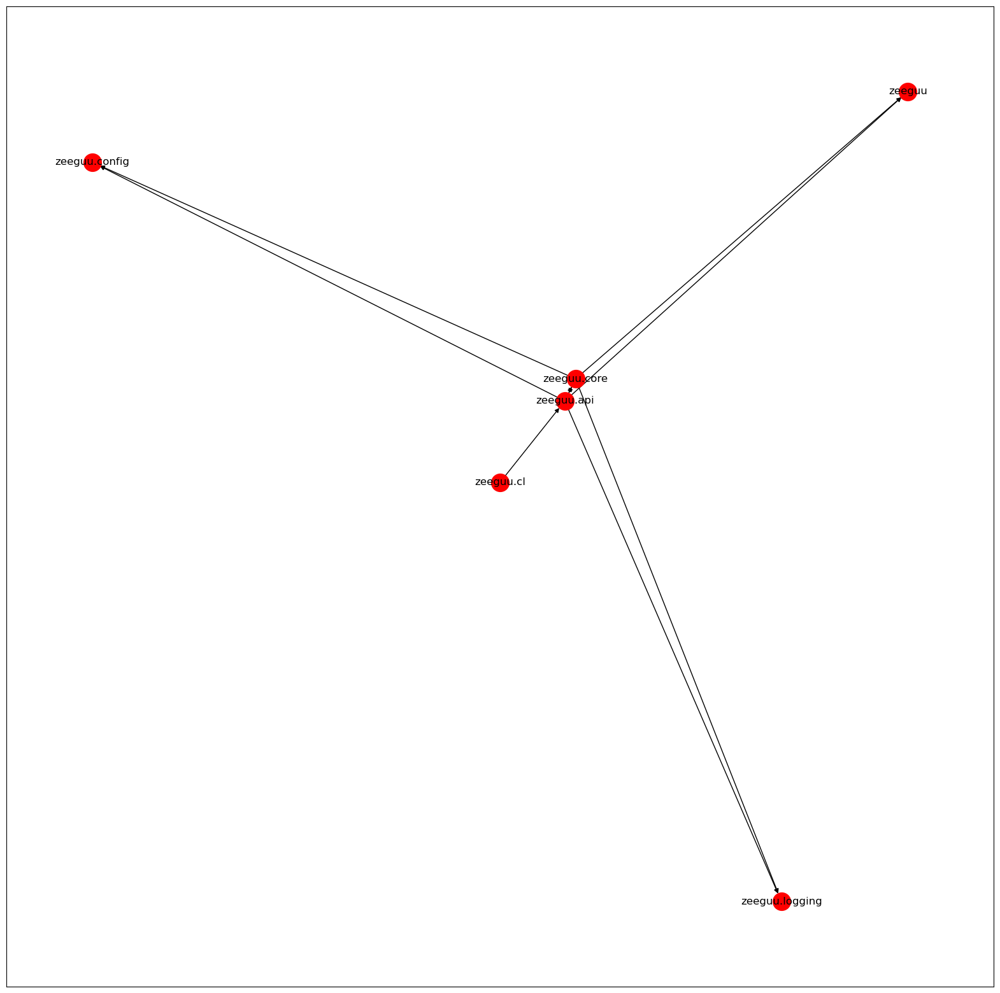

In [148]:



plt.figure(figsize=(20,20))
nx.draw_networkx(ADG, with_labels=True, node_size = 400, node_color='r')
plt.show()

# For Home: Extract Multiple Evolution Hotspots from Zeeguu

- Extract multiple complementary module views from your case study system
- Ensure that your layouts are readable - limit the number of nodes in a view, use a different layout in networkx, or use a different library than networkx
- Augment each of the previously obtained module views by mapping the above-computed churn metric on the color of a given node

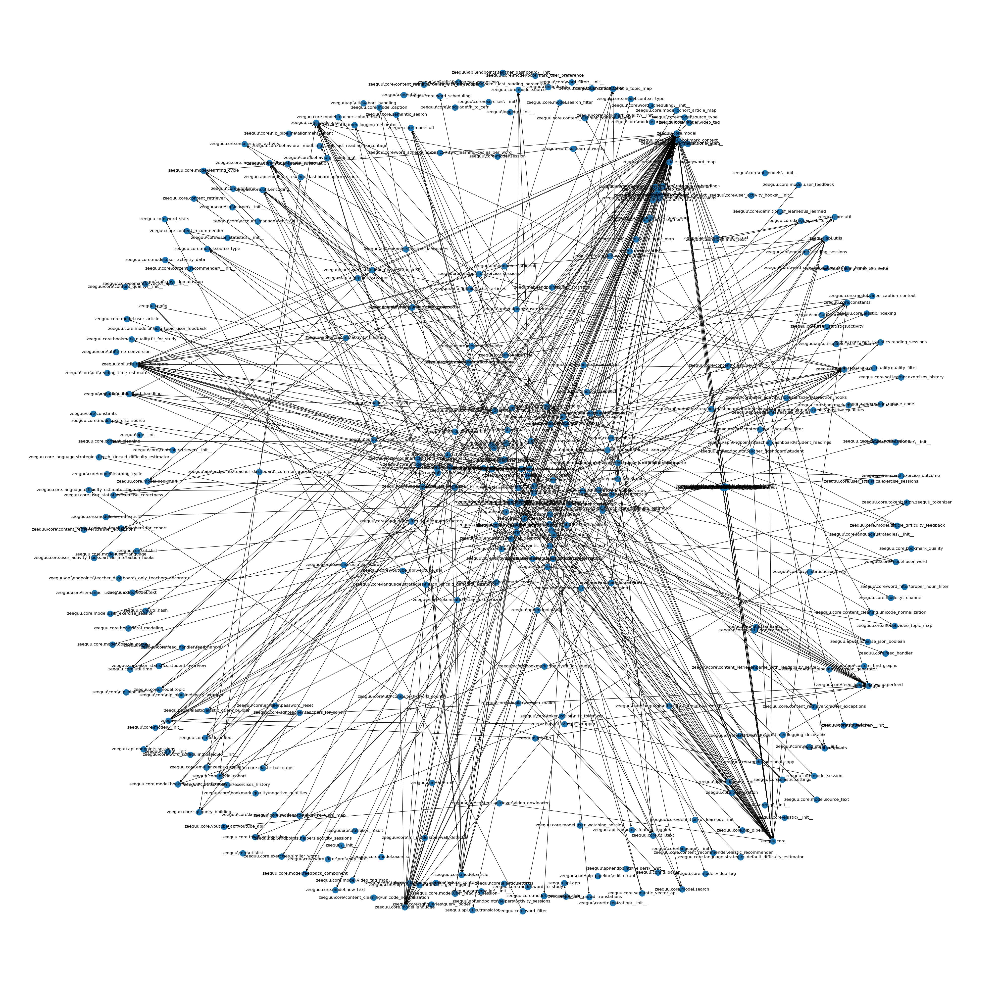

In [138]:
# i will now extract multiple complementary module views from zeeguu-api system by first showing directed graphs that omit redundant edges

def dependencies_digraph_modified(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G 

DDM = dependencies_digraph_modified(CODE_ROOT_FOLDER)
draw_graph(DDM, (40,40), with_labels=True)

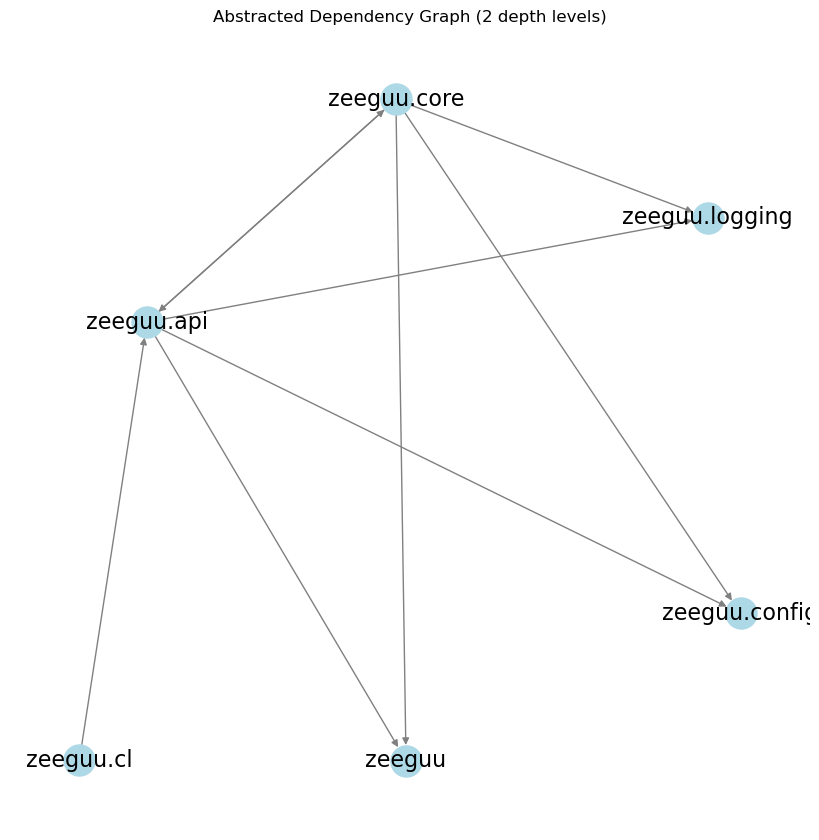

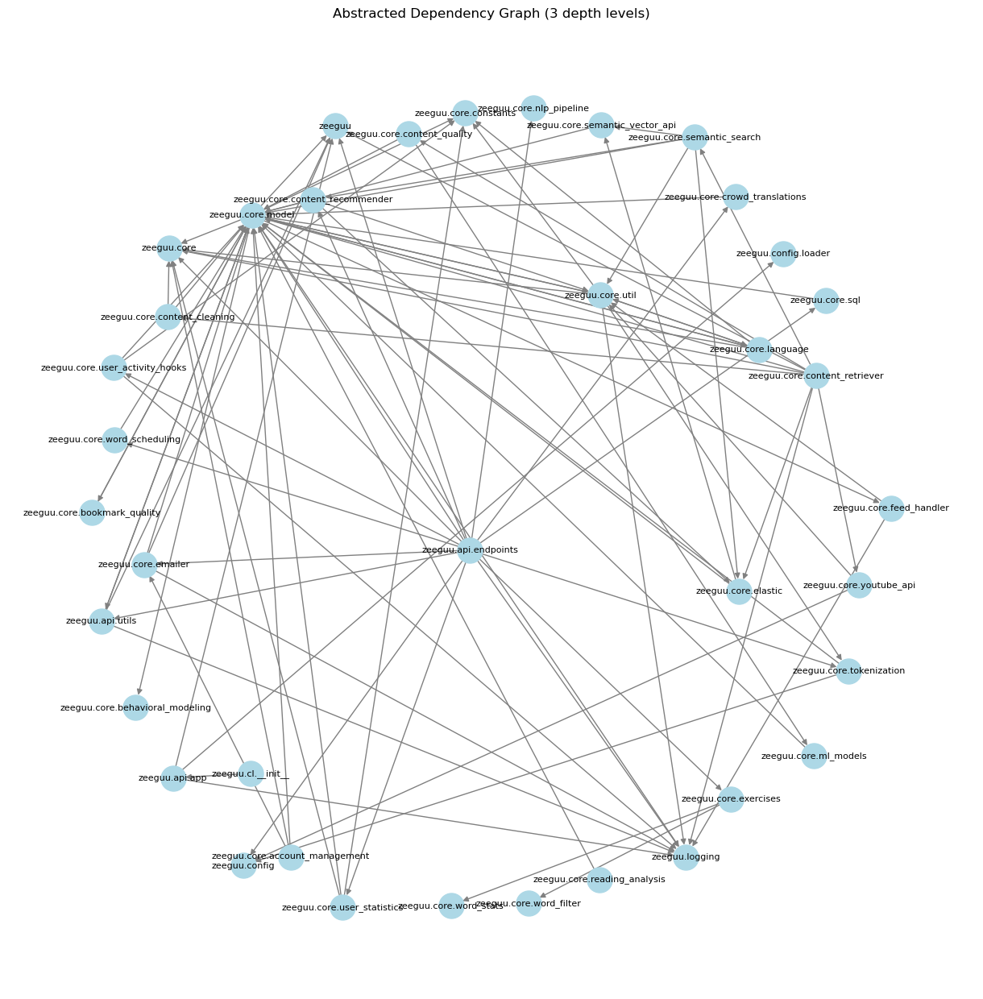

In [139]:
ADG2 = abstracted_to_top_level(DG, depth=2)  
ADG3 = abstracted_to_top_level(DG, depth=3) 

ADG2 = abstracted_to_top_level(DG, depth=2)  
ADG3 = abstracted_to_top_level(DG, depth=3) 

plt.figure(figsize=(8, 8))
nx.draw(ADG2, pos=nx.spring_layout(ADG2, k=3), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=16)
plt.title("Abstracted Dependency Graph (2 depth levels)")
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\ADG2.png", dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 12))
nx.draw(ADG3, pos=nx.spring_layout(ADG3, k=2.2), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.title("Abstracted Dependency Graph (3 depth levels)")
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\ADG3.png", dpi=300, bbox_inches='tight')
plt.show()


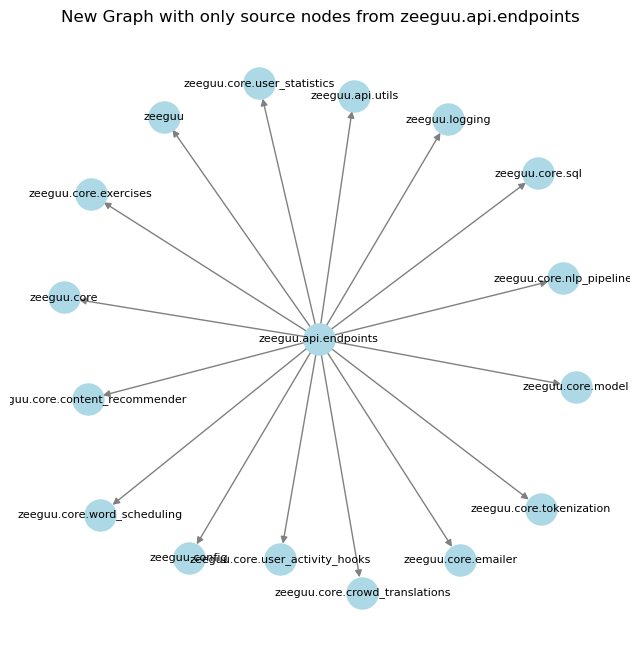

In [140]:
# I will now make a graph that ONLY has source nodes from the zeeguu.api module and its submodules, and only the first level of dependencies.
# Let's define some relevant modules
def relevant_module2(module_name, isSource):

  if "test" in module_name:
    return False

  if isSource:
    if module_name.startswith("zeeguu\\api\\endpoints") or module_name.startswith("zeeguu.api.endpoints"):
      return True
  else:
    if module_name.startswith("zeeguu"):
      return True

  return False

def dependencies_digraph_source(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module2(source_module, True):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module2(target_module, False):
            G.add_edge(source_module, target_module)


    return G

DDM = dependencies_digraph_source(CODE_ROOT_FOLDER)
# draw_graph(DDM, (40,40), with_labels=True)
DDM = abstracted_to_top_level(DDM, depth=3)
plt.figure(figsize=(8, 8))
plt.title("New Graph with only source nodes from zeeguu.api.endpoints")
nx.draw(DDM, pos=nx.spring_layout(DDM, k=0.5), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\graph_endpoints.png", dpi=300, bbox_inches='tight')
plt.show()

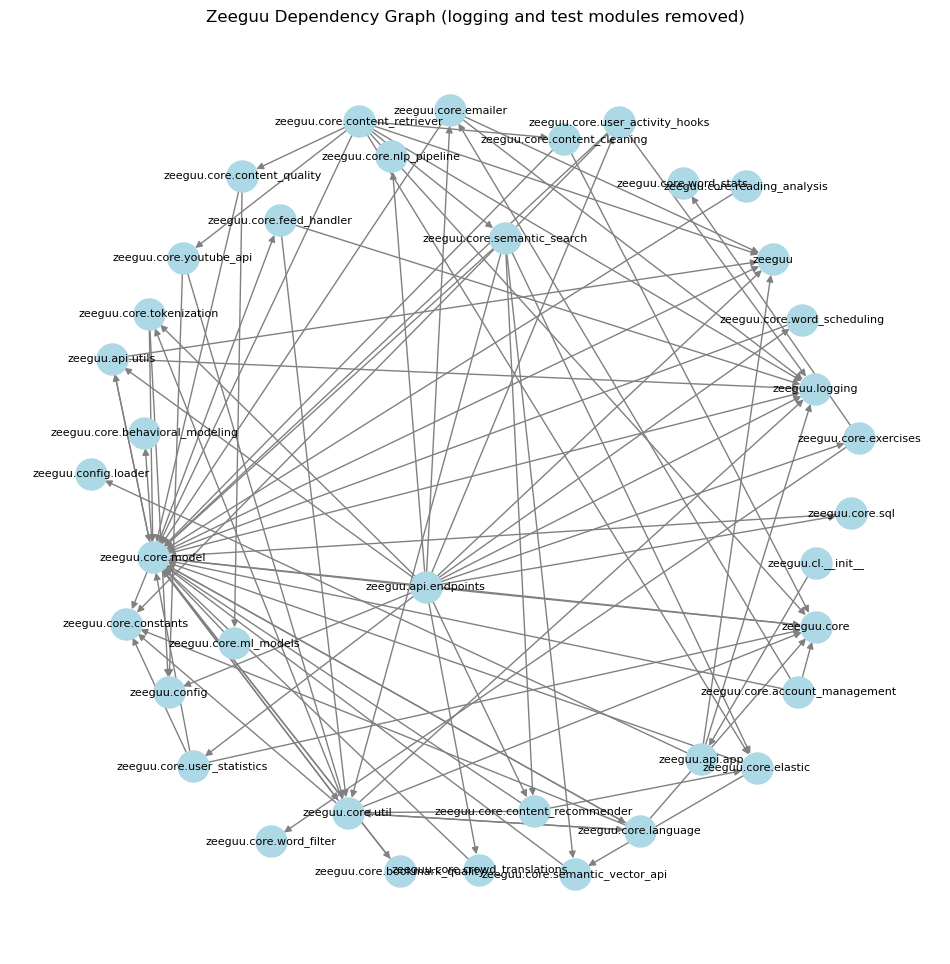

In [141]:
# Clean the 3-depth diagram

def relevant_module_clean(module_name):

    if "test" in module_name or module_name.startswith("zeeguu\\logging"):
        return False

    if module_name.startswith("zeeguu"):
        return True

    return False

def dependencies_digraph_source(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module_clean(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module_clean(target_module):
            G.add_edge(source_module, target_module)


    return G

G = dependencies_digraph_source(CODE_ROOT_FOLDER)
# draw_graph(DDM, (40,40), with_labels=True)
G = abstracted_to_top_level(G, depth=3)
plt.figure(figsize=(12, 12))
plt.title("Zeeguu Dependency Graph (logging and test modules removed)")
nx.draw(G, pos=nx.spring_layout(G, k=2.4), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\dependency_graph_remove_logging.png", dpi=300, bbox_inches='tight')
plt.show()

In [142]:
# I will now make a graph that I will use to make a package diagram, so I will group files by their packages
# and show the dependencies between packages, not files.

def module_name_from_file_path_new(full_path):
    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    # file_name = file_name.replace(".py","")
    return file_name

def dependencies_digraph_only_packages(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path_new(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G

def group_files_by_package(module_name, depth=10):
    module_name = module_name.replace("/", ".").replace("\\", ".")
    components = module_name.split(".")
    return ".".join(components[:depth])

def abstracted_to_packages(G, depth=10):
    aG = nx.DiGraph()
    for each in G.edges():
        src = group_files_by_package(each[0], depth)
        dst = group_files_by_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

PackageDiGraph = abstracted_to_packages(DG, 2)  

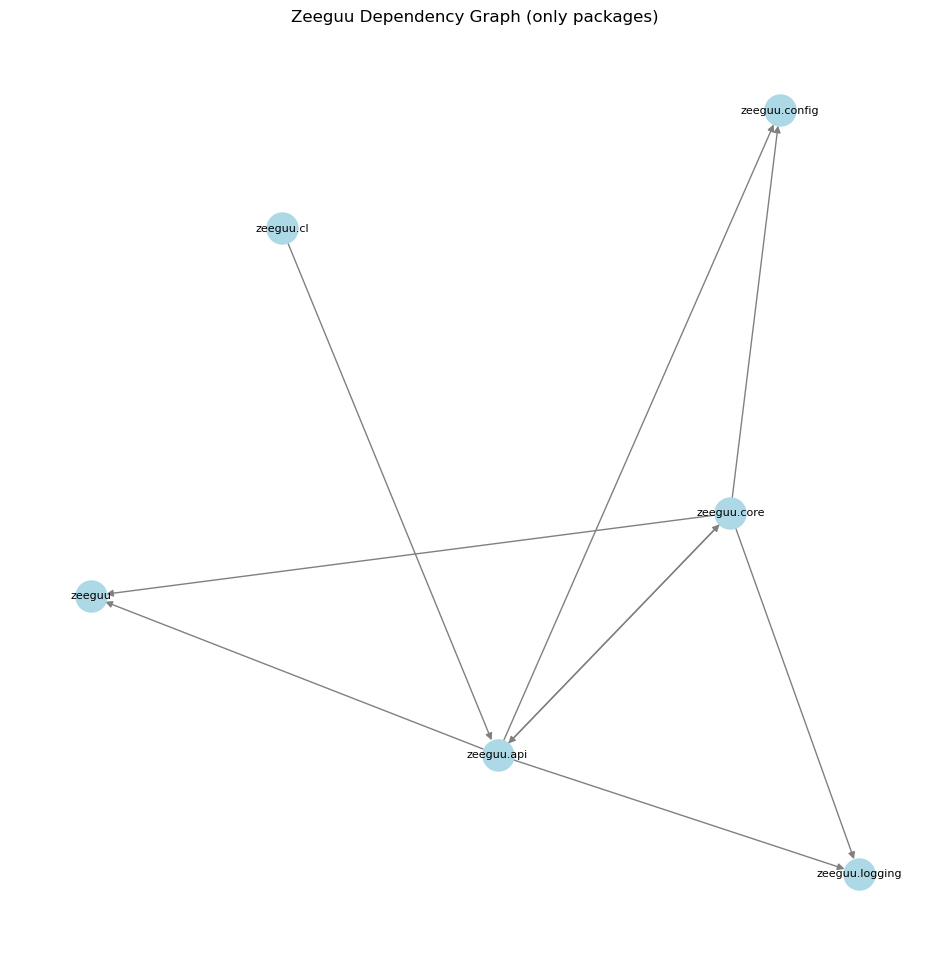

In [143]:
plt.figure(figsize=(12, 12))
plt.title("Zeeguu Dependency Graph (only packages)")
nx.draw(PackageDiGraph, pos=nx.spring_layout(PackageDiGraph, k=2.3), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\dependency_graph_only_packages.png", dpi=300, bbox_inches='tight')
plt.show()

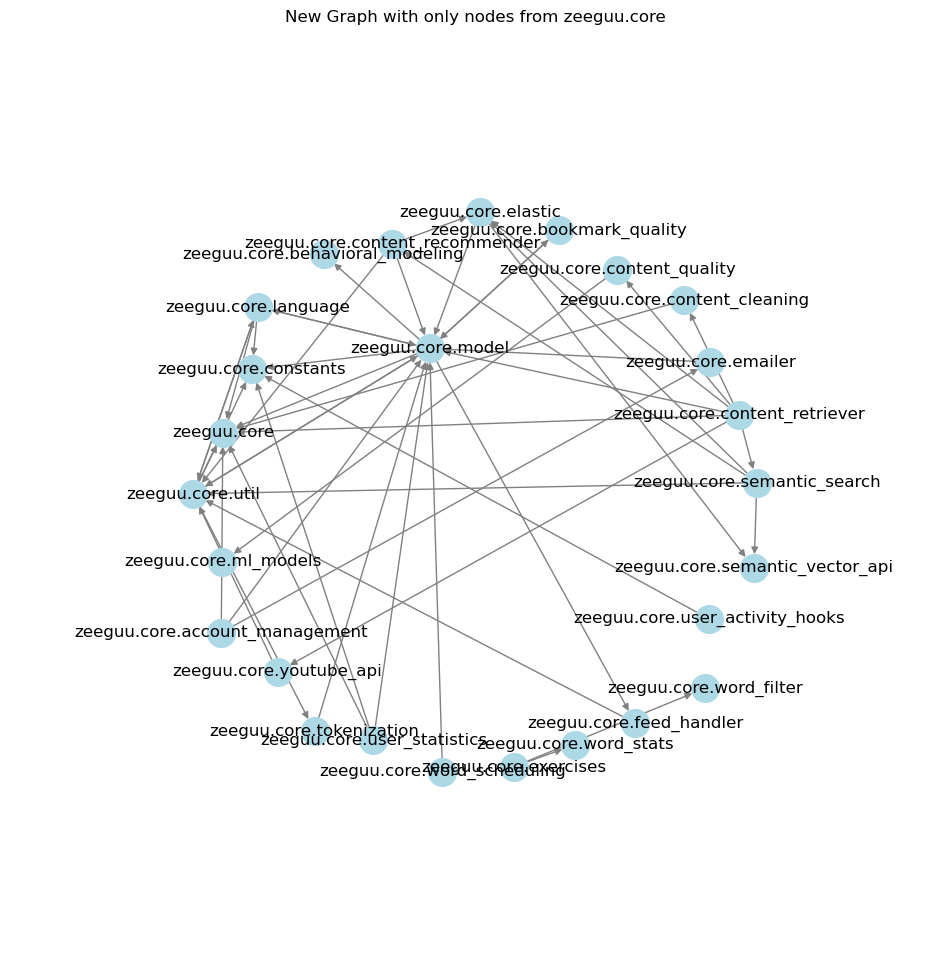

In [174]:
# I will now make a graph that ONLY has source nodes from the zeeguu.core module and its submodules
# And target is also only zeeguu.core module and its submodules.

def relevant_module3(module_name):

  if "test" in module_name or "__init__" in module_name or module_name.endswith("zeeguu.core.model") or module_name.endswith("zeeguu\\core\\model"):
    return False

  if module_name.startswith("zeeguu\\core") or module_name.startswith("zeeguu.core"):
    return True

  return False

def dependencies_digraph_source_core(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module3(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module3(target_module):
            G.add_edge(source_module, target_module)


    return G

core = dependencies_digraph_source_core(CODE_ROOT_FOLDER)
core = abstracted_to_top_level(core, depth=3)
plt.figure(figsize=(12, 12))
plt.title("New Graph with only nodes from zeeguu.core")
plt.margins(0.25)
nx.draw(core, pos=nx.spring_layout(core, k=3, seed=7245555), with_labels=True, node_size=400, node_color='lightblue', edge_color='gray', font_size=12)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\graph_core.png", dpi=300, bbox_inches='tight')
plt.show()

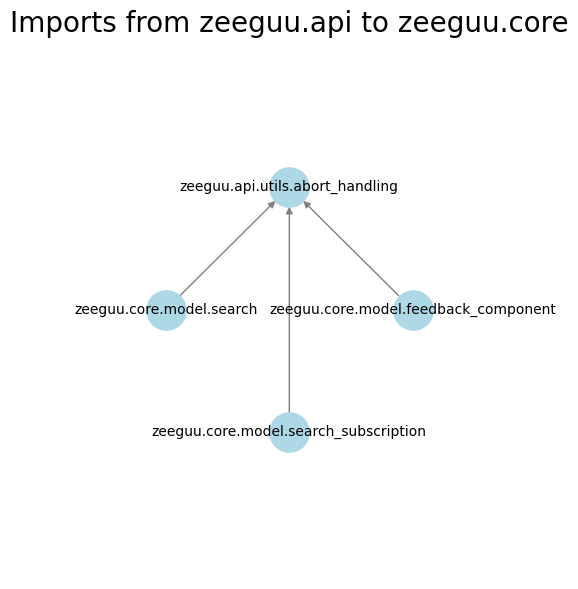

In [179]:
def relevant_module4(module_name, isSource):

  if "test" in module_name:
    return False

  if isSource:
    if module_name.startswith("zeeguu\\core") or module_name.startswith("zeeguu.core"):
      return True
  else:
    if module_name.startswith("zeeguu\\api") or module_name.startswith("zeeguu.api"):
      return True

  return False

def dependencies_digraph_source(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module4(source_module, True):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module4(target_module, False):
            G.add_edge(source_module, target_module)


    return G

DDM = dependencies_digraph_source(CODE_ROOT_FOLDER)
# draw_graph(DDM, (40,40), with_labels=True)
DDM = abstracted_to_top_level(DDM, depth=5)
plt.figure(figsize=(7, 7))
plt.title("Imports from zeeguu.api to zeeguu.core", fontsize=20)
plt.margins(0.5)
nx.draw(DDM, pos=nx.circular_layout(DDM), with_labels=True, node_size=800, node_color='lightblue', edge_color='gray', font_size=10)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\from_core_to_api.png", dpi=300, bbox_inches='tight')
plt.show()